In [1]:
%cd C:\skripsi\nst\code

C:\skripsi\nst\code


In [2]:
import torch
from torch import optim

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [3]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
from torch import nn
from torchvision.models import vgg19
from torch.nn.functional import mse_loss
from skimage.metrics import structural_similarity as ssim

In [4]:
mean = torch.FloatTensor([[[0.485, 0.456, 0.406]]])
std = torch.FloatTensor([[[0.229, 0.224, 0.225]]])

def load_image(img_path, transform):
    image = Image.open(img_path).convert('RGB')
    image = transform(image).unsqueeze(0)
    return image


def gram_matrix(X):
    n, c, h, w = X.shape
    X = X.view(n*c, h*w) # Flattening
    G = torch.mm(X, X.t())
    G = G.div(n*c*h*w) # Normalization
    return G

def draw_styled_image(output):
    styled_image = output[0].permute(1, 2, 0).cpu().detach()
    styled_image = styled_image * std + mean
    styled_image.clamp_(0, 1)
    
    plt.figure(figsize=(6, 6))
    plt.imshow(styled_image)
    plt.axis("off")
    plt.pause(0.01)
    return styled_image

In [5]:
CONTENT_PATH = "C:/skripsi/nst/code_new/NST-webapp/data/shape/whale.jpg"
STYLE_PATH = "data/batik-megamendung/1.jpg"

transform = transforms.Compose([
    transforms.Resize(300),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])  
    
content = load_image(CONTENT_PATH, transform).to(device)
style = load_image(STYLE_PATH, transform).to(device)

output = load_image(CONTENT_PATH, transform).to(device)
output.requires_grad = True

In [6]:
class NeuralStyleTransfer(nn.Module):
    def __init__(self):
        super().__init__()
        
        model = vgg19(pretrained=True).eval()
        self.model = model.features
        self.freeze()
        
    def forward(self, x, layers):
        features = []
        for i, layer in self.model._modules.items():
            x = layer(x)
            if i in layers:
                features.append(x)
        return features
    
    def freeze(self):
        for p in self.model.parameters():
            p.requires_grad = False


In [7]:
import torch
import torch.nn as nn
from torchvision.models import vgg19
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

def load_image(image_path, max_size=2000, shape=None):
    image = Image.open(image_path).convert('RGB')
    size = max_size if max(image.size) > max_size else max(image.size)
    
    if shape is not None:
        size = shape

    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))
    ])
    
    image = transform(image).unsqueeze(0)
    return image

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # clone the tensor to not change the original
    image = image.squeeze(0)      # remove the batch dimension
    image = transforms.ToPILImage()(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause to display the image

In [8]:
# def display_feature_maps(feature_maps):
#     for i, feature_map in enumerate(feature_maps):  
#         print(f"Layer {i} feature map shape: {feature_map.shape}")
#         n_maps = feature_map.shape[1]
#         fig, axes = plt.subplots(1, min(n_maps, 4), figsize=(15, 15))
#         for j in range(min(n_maps, 4)):  # Display up to 4 feature maps from each layer
#             ax = axes[j]
#             ax.imshow(feature_map[0, j].detach().numpy(), cmap='viridis')
#             ax.axis('off')
#         plt.show()

# image_path = 'C:/skripsi/nst/code/data/batik-kawung/1.jpg'
# image = load_image(image_path)
# model = NeuralStyleTransfer()

# layers = ["8", "12"]
# feature_maps = model(image, layers)
# display_feature_maps(feature_maps)

In [9]:
def criterion(content_features, style_features, output_contents, output_styles, content_weight=2, style_weight=1e8):
    # Content Loss
    content_loss = 0
    for c, o in zip(content_features, output_contents):
        content_loss += mse_loss(c, o)
    
    # Style Loss
    style_loss = 0
    for s, o in zip(style_features, output_styles):
        style_texture = gram_matrix(s)
        output_texture = gram_matrix(o)
        style_loss += mse_loss(style_texture, output_texture)
        
    # Total loss
    loss = content_weight * content_loss + style_weight * style_loss
    return loss

In [10]:
model = NeuralStyleTransfer().to(device)
optimizer = optim.AdamW([output], lr=0.05)

c:\Users\Itzzgvry\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\Itzzgvry\anaconda3\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [11]:
content_features = model(content, layers=["4", "8"])
style_features = model(style, layers=["4", "8"])

In [12]:
def calculate_ssim(img1, img2, win_size=11):
    img1 = img1.cpu().detach().numpy().squeeze().transpose(1, 2, 0)
    img2 = img2.cpu().detach().numpy().squeeze().transpose(1, 2, 0)
    
    img1 = img1 * std.cpu().numpy() + mean.cpu().numpy()
    img2 = img2 * std.cpu().numpy() + mean.cpu().numpy()
    
    img1 = (img1 * 255).astype('uint8')
    img2 = (img2 * 255).astype('uint8')
    
    ssim_value, _ = ssim(img1, img2, win_size=win_size, channel_axis=2, full=True)
    return ssim_value

Epoch:   100 | Loss: 5922.88379
Epoch:   100 | SSIM: 0.07536


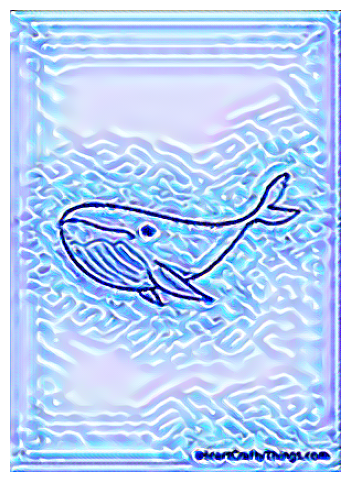

Epoch:   200 | Loss: 2182.16455
Epoch:   200 | SSIM: 0.09740


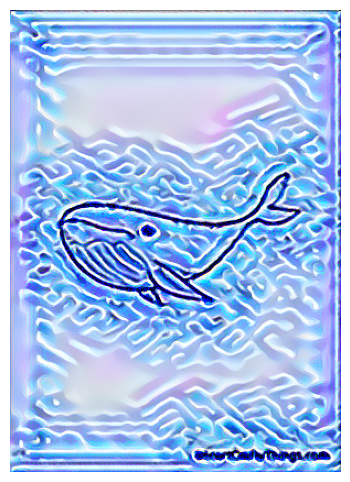

Epoch:   300 | Loss: 1054.03064
Epoch:   300 | SSIM: 0.09803


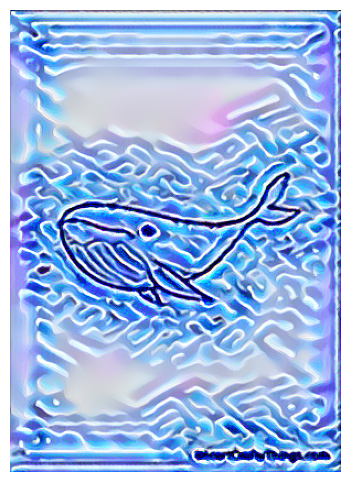

Epoch:   400 | Loss: 600.53839
Epoch:   400 | SSIM: 0.09893


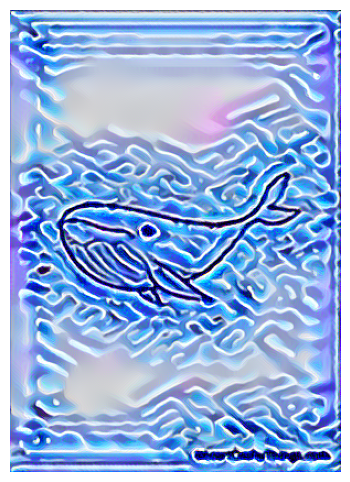

Epoch:   500 | Loss: 386.30771
Epoch:   500 | SSIM: 0.09937


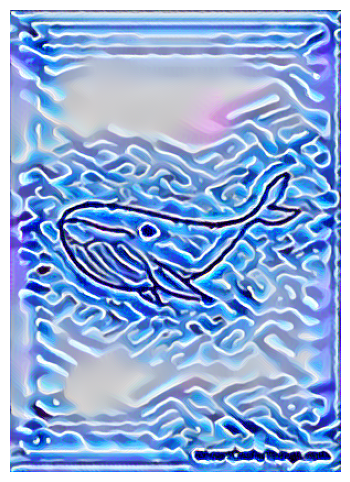

Epoch:   600 | Loss: 271.54462
Epoch:   600 | SSIM: 0.10006


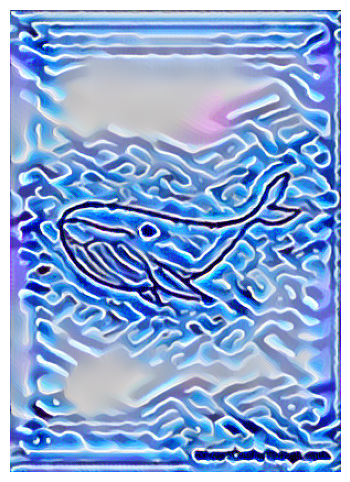

Epoch:   700 | Loss: 203.87352
Epoch:   700 | SSIM: 0.10074


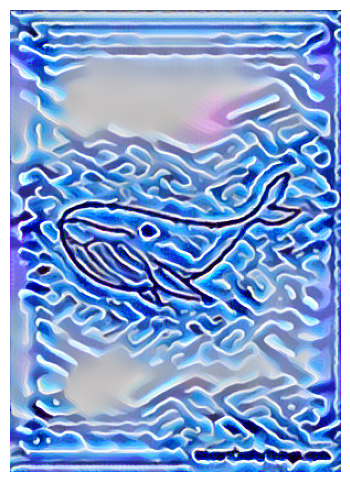

Epoch:   800 | Loss: 161.52989
Epoch:   800 | SSIM: 0.10188


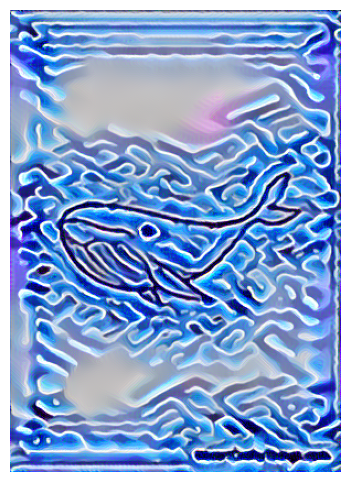

Epoch:   900 | Loss: 133.78271
Epoch:   900 | SSIM: 0.10338


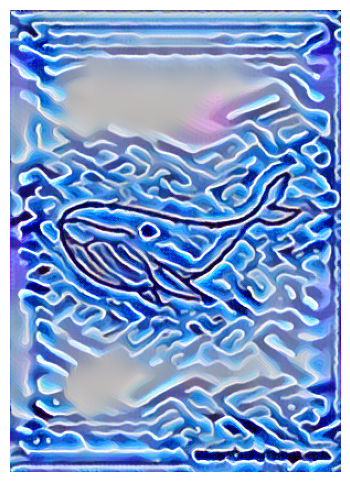

Epoch:  1000 | Loss: 114.80609
Epoch:  1000 | SSIM: 0.10527


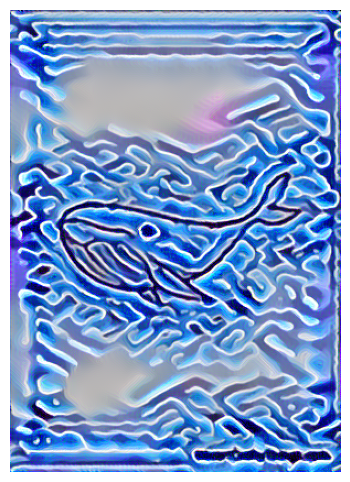

Epoch:  1100 | Loss: 101.38889
Epoch:  1100 | SSIM: 0.10675


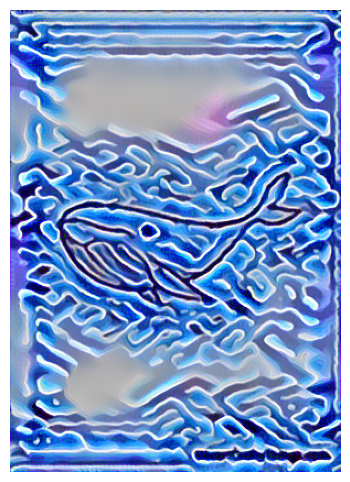

Epoch:  1200 | Loss: 92.52883
Epoch:  1200 | SSIM: 0.10891


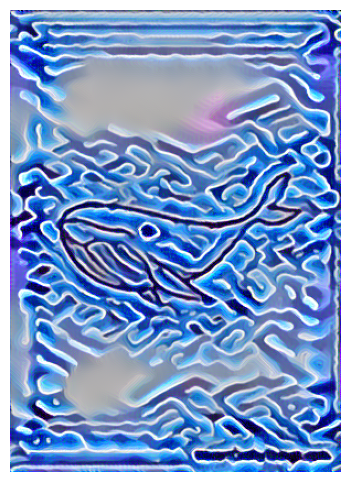

Epoch:  1300 | Loss: 88.02135
Epoch:  1300 | SSIM: 0.11086


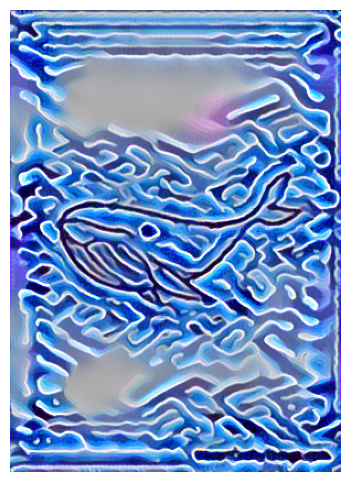

Epoch:  1400 | Loss: 121.32767
Epoch:  1400 | SSIM: 0.11232


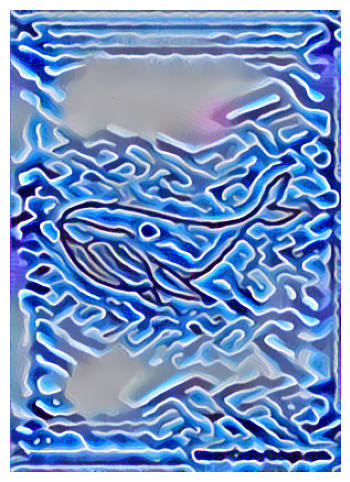

Epoch:  1500 | Loss: 92.71815
Epoch:  1500 | SSIM: 0.11512


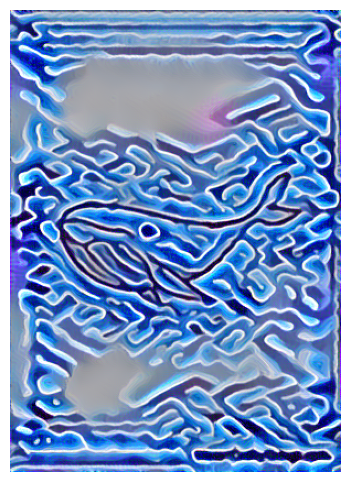

Epoch:  1600 | Loss: 83.66296
Epoch:  1600 | SSIM: 0.11668


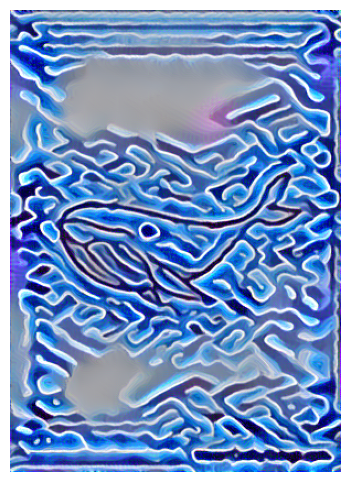

Epoch:  1700 | Loss: 78.67964
Epoch:  1700 | SSIM: 0.11776


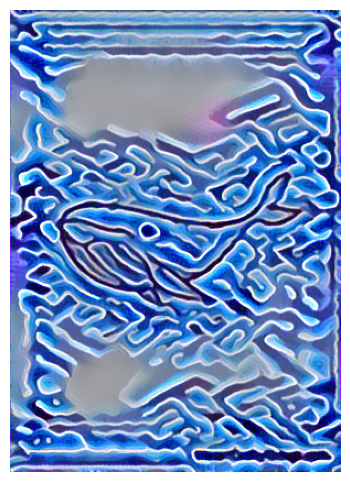

Epoch:  1800 | Loss: 75.29825
Epoch:  1800 | SSIM: 0.11863


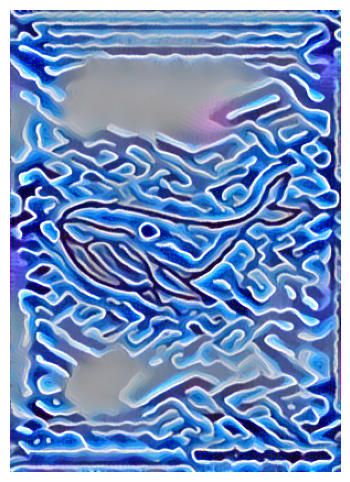

Epoch:  1900 | Loss: 72.72438
Epoch:  1900 | SSIM: 0.11907


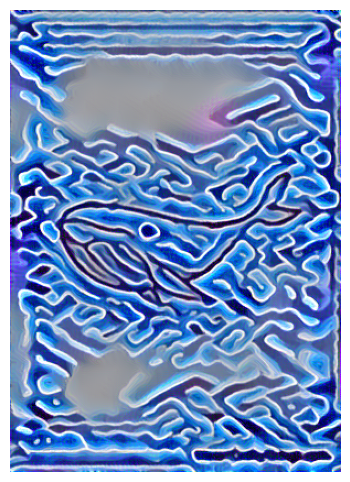

Epoch:  2000 | Loss: 70.61653
Epoch:  2000 | SSIM: 0.11937


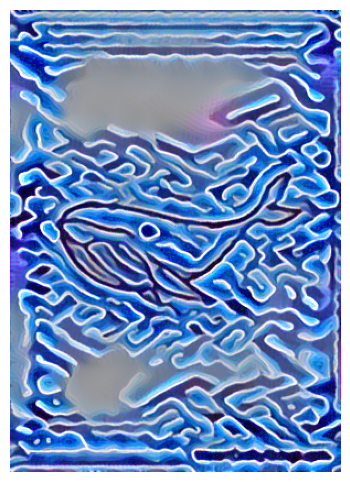

Epoch:  2100 | Loss: 68.80952
Epoch:  2100 | SSIM: 0.11960


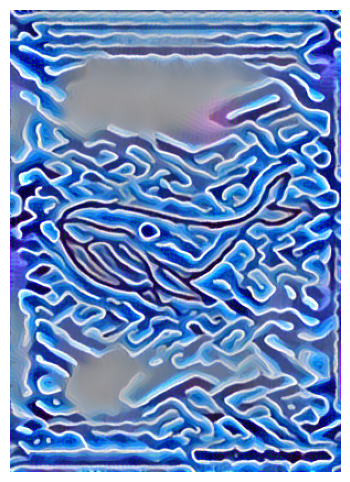

Epoch:  2200 | Loss: 67.20362
Epoch:  2200 | SSIM: 0.11991


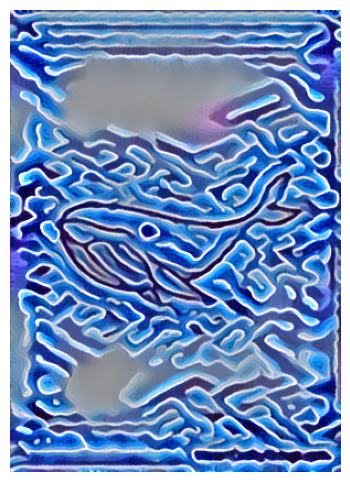

Epoch:  2300 | Loss: 65.76418
Epoch:  2300 | SSIM: 0.12000


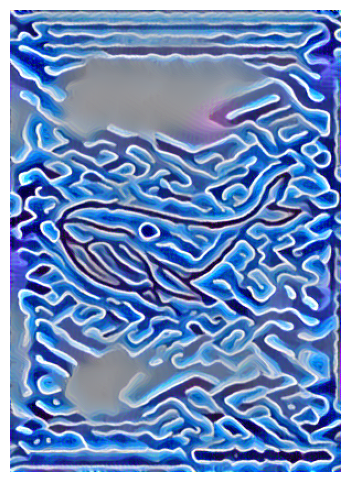

Epoch:  2400 | Loss: 64.46696
Epoch:  2400 | SSIM: 0.12004


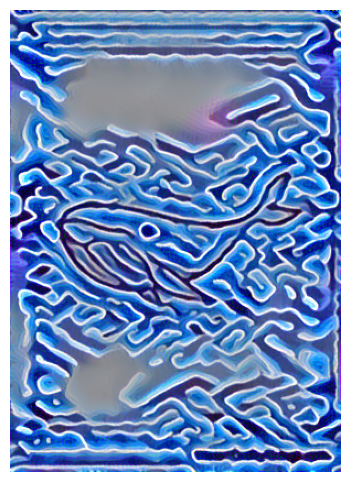

Epoch:  2500 | Loss: 63.27969
Epoch:  2500 | SSIM: 0.11987


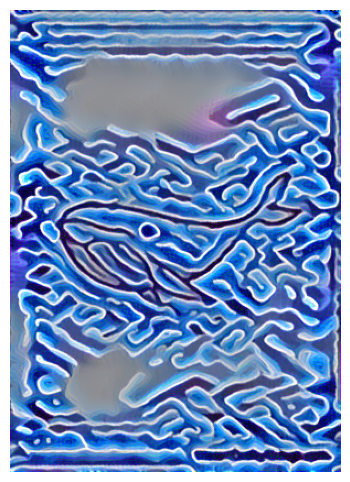

In [14]:
max_epochs = 2500
for epoch in range(1, max_epochs+1):
    output_features = model(output, layers=["4", "8"])
    loss = criterion(content_features, style_features, output_features, output_features)
    loss.backward()
    
    optimizer.step()
    optimizer.zero_grad()
    
    if epoch % 100 == 0:
        print(f"Epoch: {epoch:5} | Loss: {loss.item():.5f}")
        ssim_value = calculate_ssim(output, content)
        print(f"Epoch: {epoch:5} | SSIM: {ssim_value:.5f}")
        _ = draw_styled_image(output)